In [1]:
import warnings
warnings.simplefilter("ignore")

In [2]:
import os
import pandas as pd

# Dataset path
dataset_path = "/kaggle/input/fruit-quality-classification"
data = []

for quality in os.listdir(dataset_path):  # Bad Quality_Fruits, Good Quality_Fruits, Mixed Qualit_Fruits
    quality_path = os.path.join(dataset_path, quality)
    if os.path.isdir(quality_path):
        for fruit_folder in os.listdir(quality_path):  # Apple_Bad, Banana_Good, etc.
            fruit_path = os.path.join(quality_path, fruit_folder)
            if os.path.isdir(fruit_path):
                # Extract fruit name and quality from the folder name
                fruit = fruit_folder.rsplit("_", 1)[0]
                for img in os.listdir(fruit_path):
                    img_path = os.path.join(fruit_path, img)
                    if img.lower().endswith(('.png', '.jpg', '.jpeg')):
                        data.append([img_path, fruit, quality])

# DataFrame
df = pd.DataFrame(data, columns=["image_path", "fruit", "quality"])
df

,image_path,fruit,quality
0,/kaggle/input/fruit-quality-classification/Goo...,Apple,Good Quality_Fruits
1,/kaggle/input/fruit-quality-classification/Goo...,Apple,Good Quality_Fruits
2,/kaggle/input/fruit-quality-classification/Goo...,Apple,Good Quality_Fruits
3,/kaggle/input/fruit-quality-classification/Goo...,Apple,Good Quality_Fruits
4,/kaggle/input/fruit-quality-classification/Goo...,Apple,Good Quality_Fruits
...,...,...,...
19521,/kaggle/input/fruit-quality-classification/Bad...,Apple,Bad Quality_Fruits
19522,/kaggle/input/fruit-quality-classification/Bad...,Apple,Bad Quality_Fruits
19523,/kaggle/input/fruit-quality-classification/Bad...,Apple,Bad Quality_Fruits
19524,/kaggle/input/fruit-quality-classification/Bad...,Apple,Bad Quality_Fruits


In [3]:
# Total number of images
total_images = len(df)
print(f"Total number of images: {total_images}")

# Number of images per fruit
images_per_fruit = df['fruit'].value_counts()
print("\nNumber of images per fruit:")
print(images_per_fruit)

# Number of images per quality
images_per_quality = df['quality'].value_counts()
print("\nNumber of images per quality:")
print(images_per_quality)

Total number of images: 19526

Number of images per fruit:
fruit
Pomegranate    7252
Orange         2500
Banana         2485
Guava          2429
Apple          2403
Lime           2179
Lemon           278
Name: count, dtype: int64

Number of images per quality:
quality
Good Quality_Fruits    11664
Bad Quality_Fruits      6788
Mixed Qualit_Fruits     1074
Name: count, dtype: int64


In [4]:
import os
import pandas as pd
import cv2
import numpy as np

# function to load fruit data
def load_fruit_data(fruit):
    # filtering dataset for selected fruit
    df_fruit = df[df['fruit'] == fruit]
    images, labels = [], []
    
    for _, row in df_fruit.iterrows():
        img = cv2.imread(row['image_path'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # converting BGR to RGB
        img = cv2.resize(img, (256, 256))  # resizing to fixed size
        images.append(img)
        labels.append(row['quality'])
    
    images = np.array(images) / 255.0  # normalizing pixel values
    return images, labels


In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import numpy as np

# function to analyze fruit data
def analyze_fruit_data(fruit, images, labels):
    # encoding labels
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(labels)
    unique_labels = label_encoder.classes_
    
    # printing class distribution
    print(f"\nClass Distribution for {fruit}:")
    class_counts = pd.Series(encoded_labels).value_counts()
    for i, count in class_counts.items():
        print(f"{unique_labels[i]}: {count}")
    
    # plotting class distribution
    plt.figure(figsize=(6, 4))
    sns.countplot(x=labels)
    plt.title(f"{fruit} - Class Distribution")
    plt.show()
    
    # plotting sample images from each class
    num_classes = len(unique_labels)
    num_samples = 5

    fig, axes = plt.subplots(num_classes, num_samples, figsize=(15, 3 * num_classes))
    fig.suptitle(f"{fruit} - Sample Images by Class", fontsize=16)

    for i, label in enumerate(unique_labels):
        # getting indices for the current class
        indices = np.where(np.array(labels) == label)[0][:num_samples]
        for j, idx in enumerate(indices):
            ax = axes[i, j] if num_classes > 1 else axes[j]
            ax.imshow(images[idx])
            ax.set_title(label)
            ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

In [6]:
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# function to prepare data
def prepare_data(images, labels):
    # splitting into train and test
    X_train, X_test, y_train, y_test = train_test_split(
        images, labels, test_size=0.2, random_state=42, stratify=labels
    )
        
    # encoding labels
    unique_labels = np.unique(labels)
    y_train_enc = to_categorical([np.where(unique_labels == y)[0][0] for y in y_train])
    y_test_enc = to_categorical([np.where(unique_labels == y)[0][0] for y in y_test])
    
    # augmenting training data
    train_datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    
    train_generator = train_datagen.flow(X_train, y_train_enc, batch_size=32)

    
    # calculating class weights
    class_weights = compute_class_weight(
        class_weight="balanced",
        classes=np.unique(labels),
        y=labels
    )
    class_weights_dict = dict(enumerate(class_weights))
    
    return train_generator, X_test, y_train_enc, y_test_enc, class_weights_dict


# Hyperparameter Tuning

In [7]:
import keras_tuner as kt
from tensorflow.keras import layers, models

# function to hypertune the model
def hypertune_model(train_generator, X_test, y_train_enc, y_test_enc, class_weights, input_shape, num_classes):
    def build_model(hp):
        model = models.Sequential()
        model.add(layers.Conv2D(
            int(hp.Int('conv1_filters', min_value=16, max_value=64, step=16)),
            (3, 3),
            activation='relu',
            input_shape=input_shape
        ))
        model.add(layers.MaxPooling2D((2, 2)))

        model.add(layers.Conv2D(
            int(hp.Int('conv2_filters', min_value=32, max_value=128, step=32)),
            (3, 3),
            activation='relu'
        ))
        model.add(layers.MaxPooling2D((2, 2)))

        model.add(layers.Flatten())
        model.add(layers.Dense(
            int(hp.Int('dense_units', min_value=64, max_value=256, step=32)),
            activation='relu'
        ))
        model.add(layers.Dropout(float(hp.Float('dropout', 0.1, 0.5, step=0.2))))
        
        model.add(layers.Dense(num_classes, activation='softmax'))
        
        model.compile(
            optimizer=hp.Choice('optimizer', ['adam', 'sgd']),
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )
        
        return model

    tuner = kt.Hyperband(
        build_model,
        objective='val_accuracy',
        max_epochs=10,
        factor=3,
        directory='hypertuning',
        project_name='fruit_classification'
    )
    
    # Fixing class weight data type issue
    class_weights = {int(k): float(v) for k, v in class_weights.items()}
    
    tuner.search(
        train_generator,
        epochs=10,
        validation_data=(X_test, y_test_enc),
        class_weight=class_weights
    )
    
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
    print(f"\nBest Hyperparameters: {best_hps.values}")
    
    # building final model with best hyperparameters
    model = build_model(best_hps)
    
    return model


Loaded 2485 images for Banana

Class Distribution for Banana:
Good Quality_Fruits: 1113
Bad Quality_Fruits: 1087
Mixed Qualit_Fruits: 285


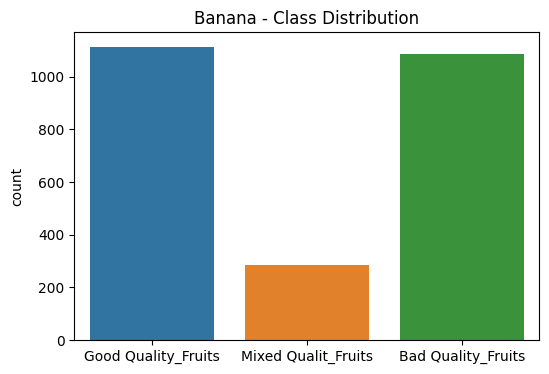

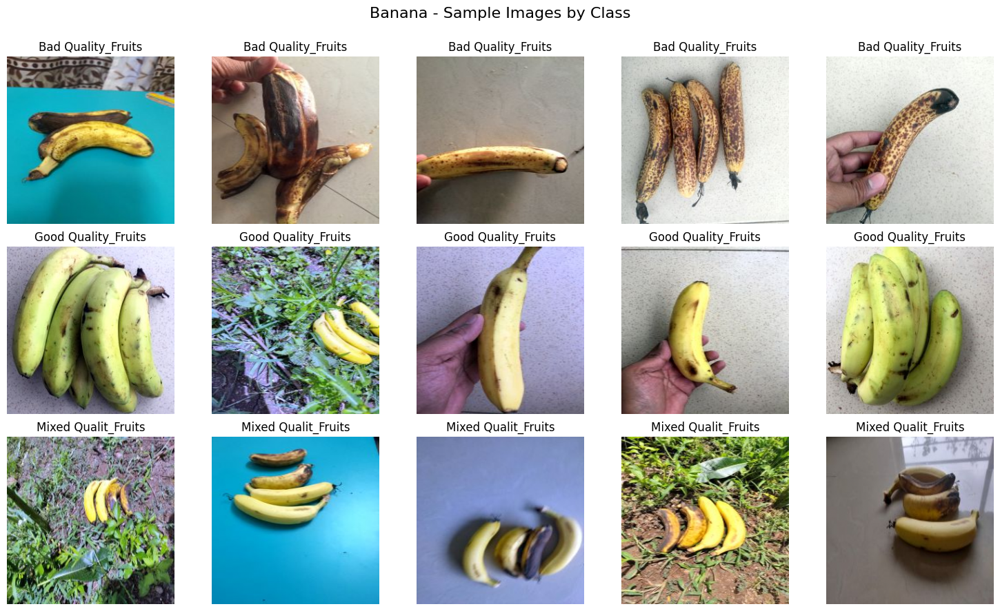

In [8]:
fruit = "Banana"

# loading data
images, labels = load_fruit_data(fruit)
print(f"Loaded {len(images)} images for {fruit}")

# analyzing data
analyze_fruit_data(fruit, images, labels)

# preparing data
train_generator, X_test, y_train_enc, y_test_enc, class_weights = prepare_data(images, labels)



In [9]:
# # creating and hypertuning model
# input_shape = (256, 256, 3)
# num_classes = len(np.unique(labels))
# model = hypertune_model(train_generator, X_test, y_train_enc, y_test_enc, class_weights, input_shape, num_classes)

# Training Models for each Fruit

In [10]:
# function to build final model using best params
def build_final_model(input_shape, num_classes):
    # Best hyperparameters
    conv1_filters = 48
    conv2_filters = 32
    dense_units = 64
    dropout = 0.1
    optimizer = 'adam'
    activation = 'relu'
    
    model = models.Sequential()
    
    model.add(layers.Conv2D(
        conv1_filters,
        (3, 3),
        activation=activation,
        input_shape=input_shape
    ))
    model.add(layers.MaxPooling2D((2, 2)))
    
    model.add(layers.Conv2D(
        conv2_filters,
        (3, 3),
        activation=activation
    ))
    model.add(layers.MaxPooling2D((2, 2)))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(
        dense_units,
        activation=activation
    ))
    model.add(layers.Dropout(dropout))
    
    model.add(layers.Dense(num_classes, activation='softmax'))
    
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

In [11]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# function to evaluate model
def evaluate_model(model, X_test, y_test_enc, history):
    # evaluating model on test data
    loss, accuracy = model.evaluate(X_test, y_test_enc, verbose=0)
    print(f"\nTest Accuracy: {accuracy:.4f}")
    
    # generating predictions
    y_pred = model.predict(X_test, verbose=0)
    y_pred_classes = y_pred.argmax(axis=1)
    y_true_classes = y_test_enc.argmax(axis=1)
    
    # calculating accuracy, precision, recall, F1-score
    accuracy = accuracy_score(y_true_classes, y_pred_classes)
    precision = precision_score(y_true_classes, y_pred_classes, average='weighted')
    recall = recall_score(y_true_classes, y_pred_classes, average='weighted')
    f1 = f1_score(y_true_classes, y_pred_classes, average='weighted')
    
    # printing results
    print("\nEvaluation Metrics:")
    print(f"Accuracy :  {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall   :    {recall:.4f}")
    print(f"F1 Score :  {f1:.4f}")
    
    # printing classification report
    print("\nClassification Report:")
    print(classification_report(y_true_classes, y_pred_classes, target_names=['Bad Quality', 'Good Quality', 'Mixed Quality']))
    
    # plotting confusion matrix
    cm = confusion_matrix(y_true_classes, y_pred_classes)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Bad Quality', 'Good Quality', 'Mixed Quality'], 
                yticklabels=['Bad Quality', 'Good Quality', 'Mixed Quality'])
    plt.title("Confusion Matrix")
    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.show()

    # plotting training history
    history = history.history
    plt.figure(figsize=(12, 5))
    
    # accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history['accuracy'], label='Train Accuracy')
    plt.plot(history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [12]:
import pickle
import os

# function to save the model
def save_model(model, label_encoder, fruit):
    save_dir = f'./saved_models/{fruit}'
    os.makedirs(save_dir, exist_ok=True)
    
    # saving model
    model.save(os.path.join(save_dir, 'model.h5'))
    
    # saving label encoder
    with open(os.path.join(save_dir, 'label_encoder.pkl'), 'wb') as f:
        pickle.dump(label_encoder, f)
    
    print(f"\nModel and label encoder saved to {save_dir}")



Training model for: Apple

Loaded 2403 images for Apple

Class Distribution for Apple:
Good Quality_Fruits: 1149
Bad Quality_Fruits: 1141
Mixed Qualit_Fruits: 113


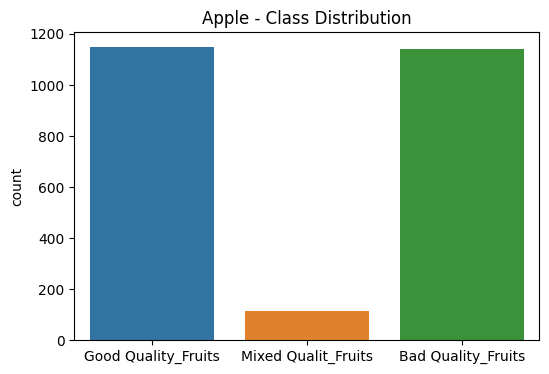

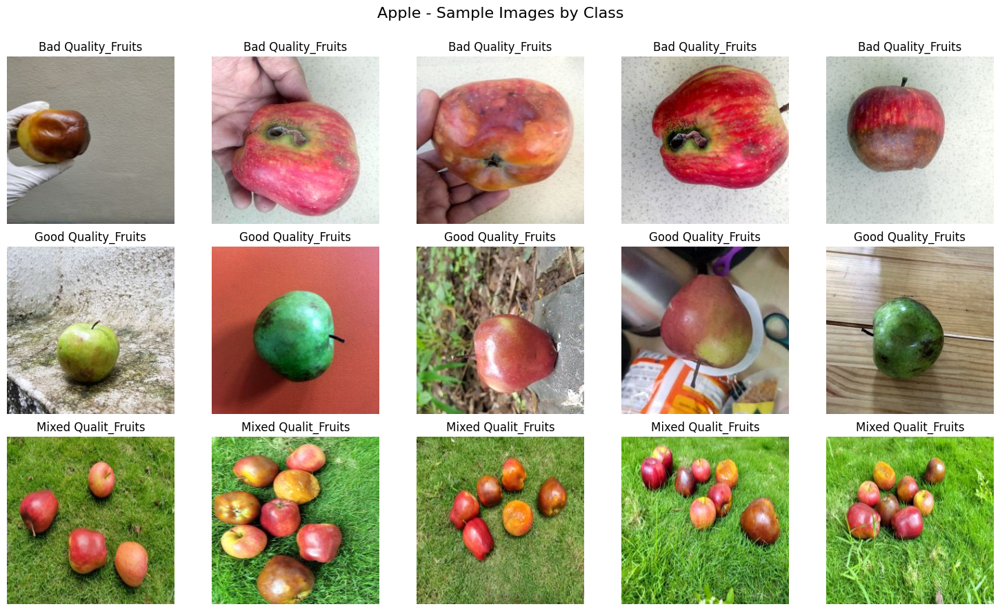

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 33s 398ms/step - accuracy: 0.5167 - loss: 1.3348 - val_accuracy: 0.7963 - val_loss: 0.4562
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 329ms/step - accuracy: 0.7822 - loss: 0.3471 - val_accuracy: 0.8482 - val_loss: 0.3831
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 331ms/step - accuracy: 0.7897 - loss: 0.3320 - val_accuracy: 0.8316 - val_loss: 0.4270
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 332ms/step - accuracy: 0.8147 - loss: 0.2847 - val_accuracy: 0.8378 - val_loss: 0.3743
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 338ms/step - accuracy: 0.8289 - loss: 0.3198 - val_accuracy: 0.8607 - val_loss: 0.3157
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 334ms/step - accuracy: 0.8748 - loss: 0.2113 - val_accuracy: 0.8815 - val_loss: 0.2862
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 332ms/step - accuracy: 0.8681 - loss: 0.2007 - val_accuracy: 0.8545 - val_loss: 0.4253
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 326ms/step - accuracy: 0.7857 - loss: 0.4171 - val_accu

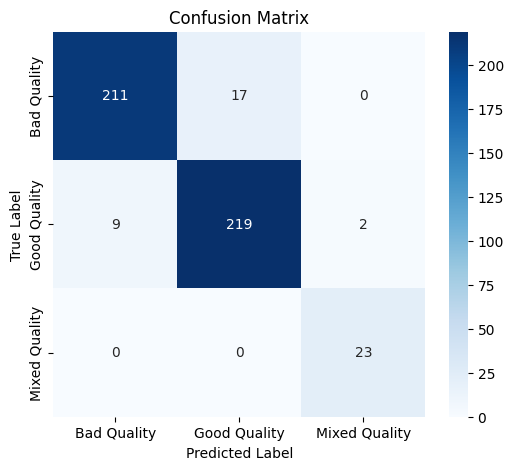

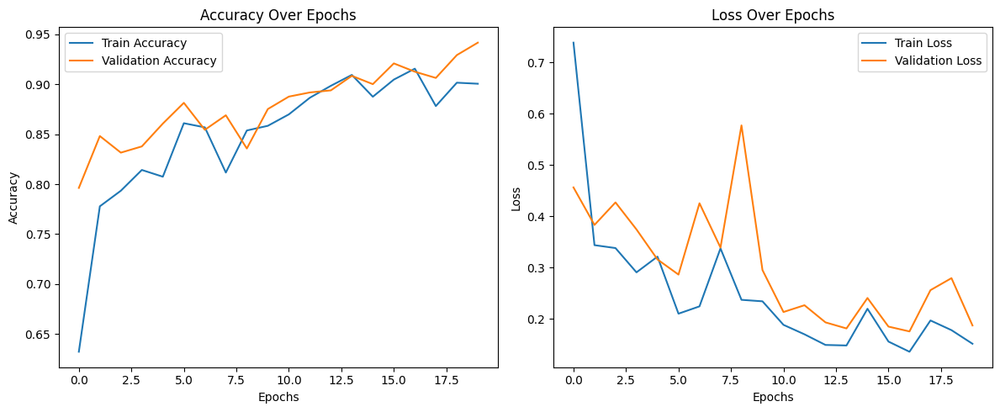


Model and label encoder saved to ./saved_models/Apple
Model training and saving complete for: Apple


Training model for: Banana

Loaded 2485 images for Banana

Class Distribution for Banana:
Good Quality_Fruits: 1113
Bad Quality_Fruits: 1087
Mixed Qualit_Fruits: 285


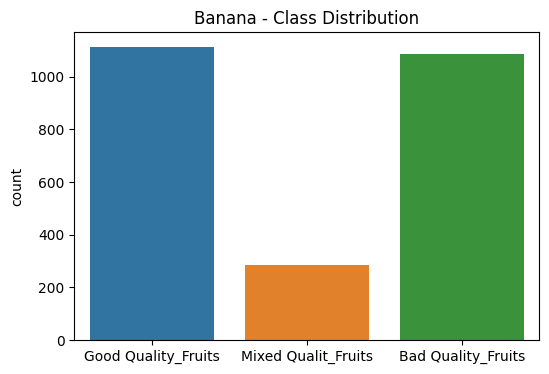

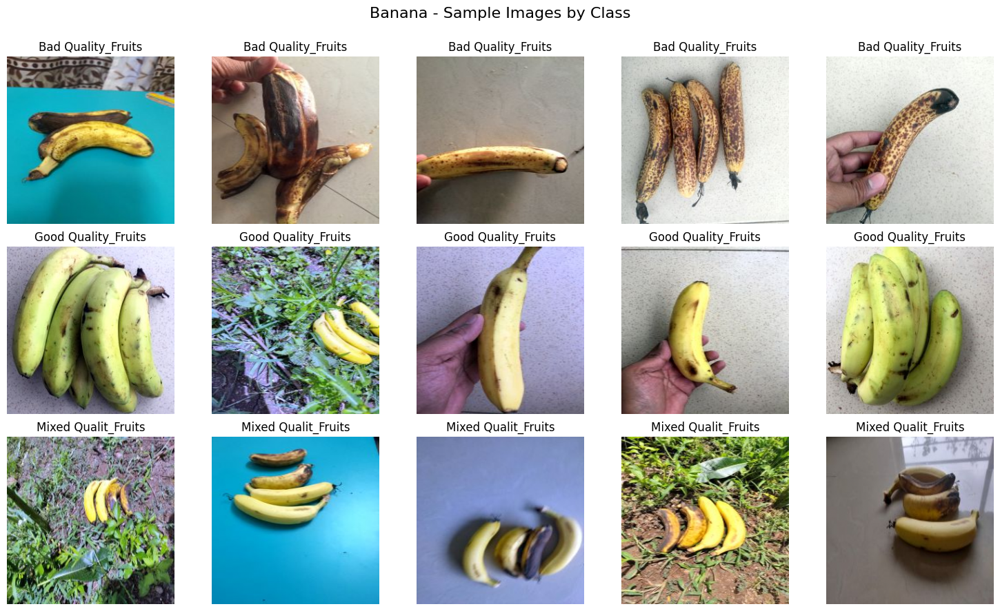

Epoch 1/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 382ms/step - accuracy: 0.4549 - loss: 1.8237 - val_accuracy: 0.8551 - val_loss: 0.9172
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 23s 329ms/step - accuracy: 0.7854 - loss: 0.6878 - val_accuracy: 0.8793 - val_loss: 0.2904
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 24s 330ms/step - accuracy: 0.8651 - loss: 0.4663 - val_accuracy: 0.8893 - val_loss: 0.3920
Epoch 4/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 23s 329ms/step - accuracy: 0.8671 - loss: 0.4139 - val_accuracy: 0.9115 - val_loss: 0.2709
Epoch 5/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 24s 330ms/step - accuracy: 0.8824 - loss: 0.3918 - val_accuracy: 0.9175 - val_loss: 0.2826
Epoch 6/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 24s 331ms/step - accuracy: 0.8674 - loss: 0.3950 - val_accuracy: 0.9175 - val_loss: 0.1967
Epoch 7/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 23s 330ms/step - accuracy: 0.8758 - loss: 0.3749 - val_accuracy: 0.9135 - val_loss: 0.1826
Epoch 8/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 24s 338ms/step - accuracy: 0.8990 - loss: 0.3326 - val_accu

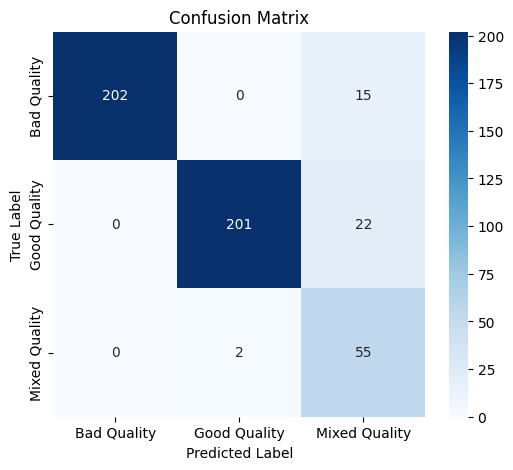

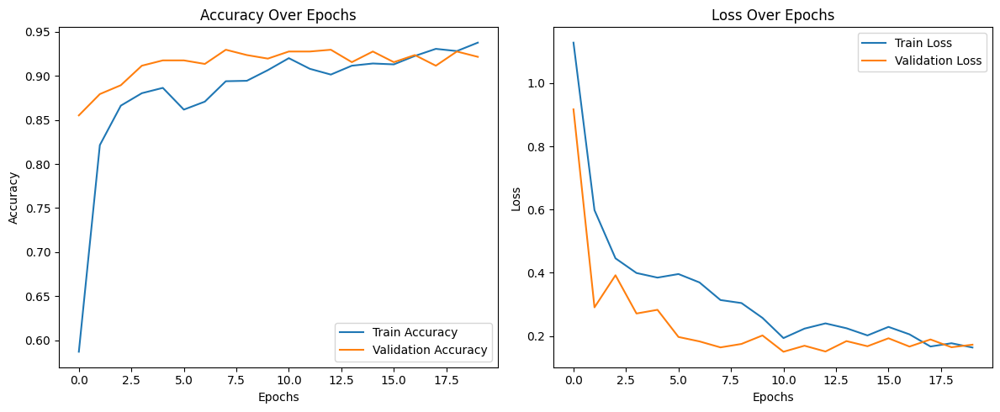


Model and label encoder saved to ./saved_models/Banana
Model training and saving complete for: Banana


Training model for: Guava

Loaded 2429 images for Guava

Class Distribution for Guava:
Good Quality_Fruits: 1152
Bad Quality_Fruits: 1129
Mixed Qualit_Fruits: 148


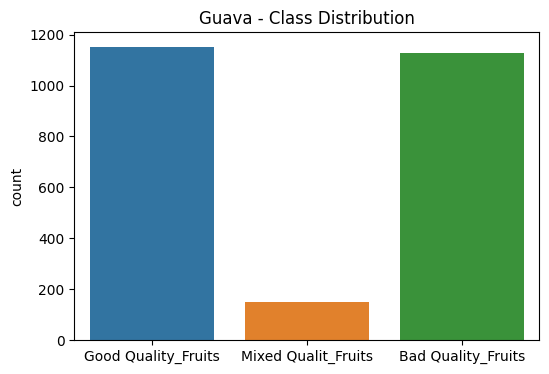

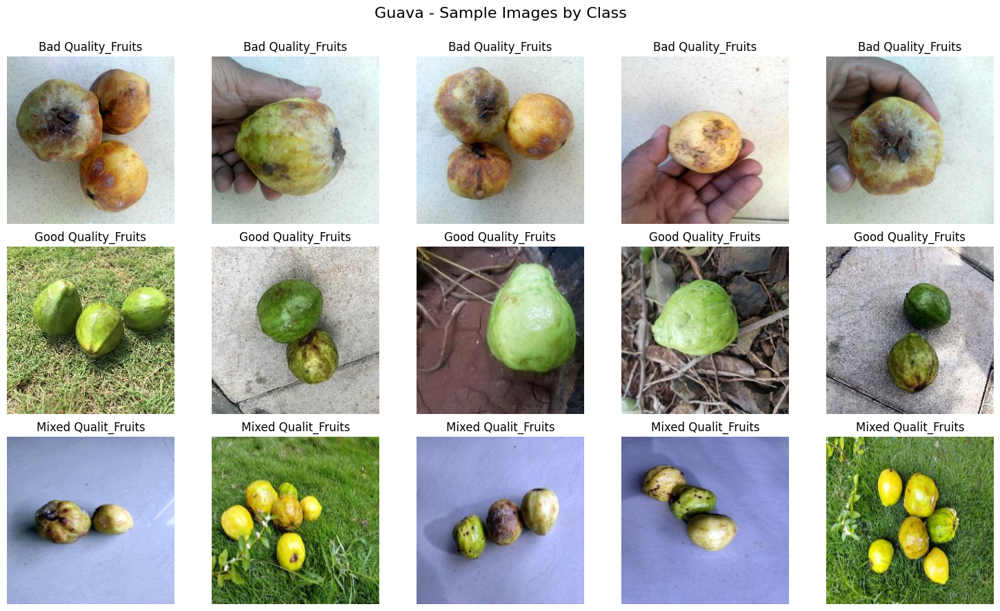

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 31s 435ms/step - accuracy: 0.3597 - loss: 2.5496 - val_accuracy: 0.8663 - val_loss: 0.5518
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 337ms/step - accuracy: 0.6290 - loss: 0.8921 - val_accuracy: 0.8868 - val_loss: 0.3646
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 331ms/step - accuracy: 0.7833 - loss: 0.5840 - val_accuracy: 0.9033 - val_loss: 0.3311
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 334ms/step - accuracy: 0.7938 - loss: 0.5260 - val_accuracy: 0.9177 - val_loss: 0.2245
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 333ms/step - accuracy: 0.8288 - loss: 0.5103 - val_accuracy: 0.9177 - val_loss: 0.2706
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 335ms/step - accuracy: 0.8429 - loss: 0.4330 - val_accuracy: 0.9280 - val_loss: 0.2214
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 334ms/step - accuracy: 0.8382 - loss: 0.4536 - val_accuracy: 0.9300 - val_loss: 0.2669
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 339ms/step - accuracy: 0.8846 - loss: 0.3608 - val_accu

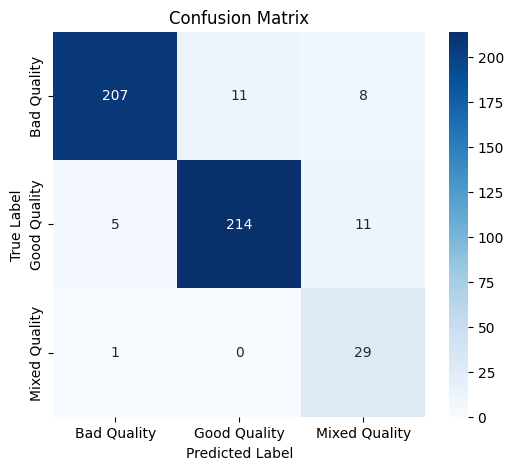

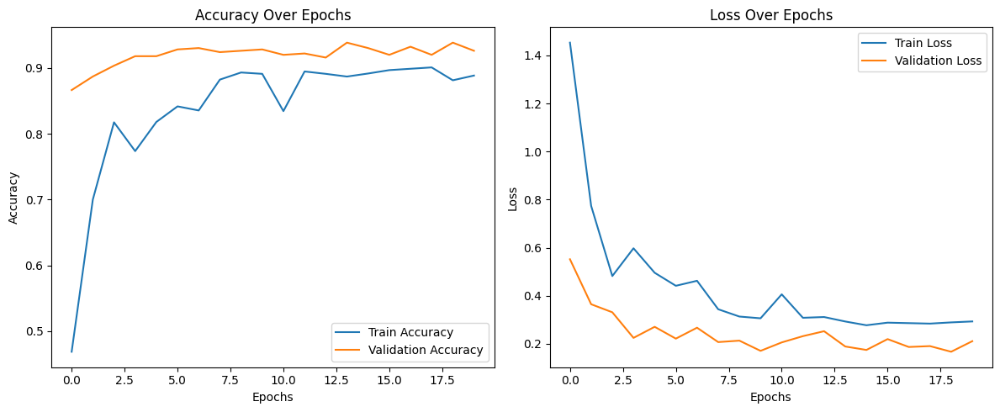


Model and label encoder saved to ./saved_models/Guava
Model training and saving complete for: Guava


Training model for: Lime

Loaded 2179 images for Lime

Class Distribution for Lime:
Good Quality_Fruits: 1094
Bad Quality_Fruits: 1085


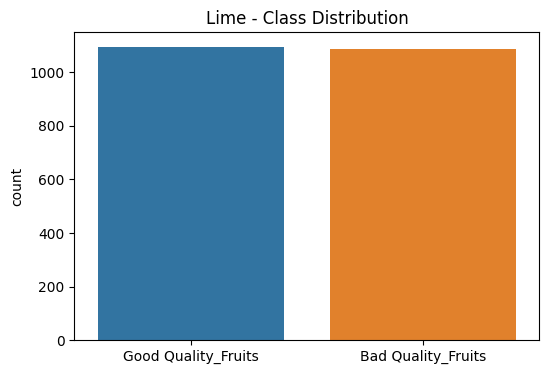

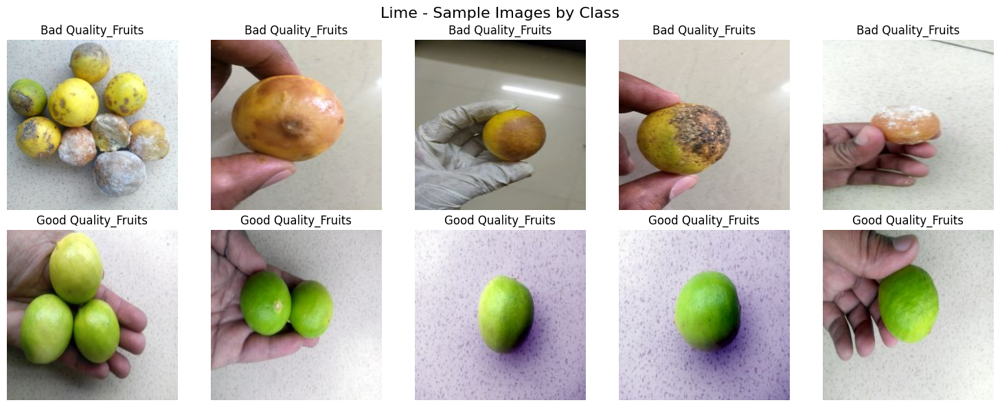

Epoch 1/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 29s 439ms/step - accuracy: 0.7472 - loss: 0.9173 - val_accuracy: 0.9908 - val_loss: 0.0463
Epoch 2/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 328ms/step - accuracy: 0.9747 - loss: 0.0823 - val_accuracy: 0.9908 - val_loss: 0.0220
Epoch 3/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 326ms/step - accuracy: 0.9703 - loss: 0.0636 - val_accuracy: 0.9954 - val_loss: 0.0133
Epoch 4/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 329ms/step - accuracy: 0.9689 - loss: 0.0775 - val_accuracy: 0.9954 - val_loss: 0.0483
Epoch 5/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 330ms/step - accuracy: 0.9878 - loss: 0.0415 - val_accuracy: 1.0000 - val_loss: 0.0106
Epoch 6/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 326ms/step - accuracy: 0.9859 - loss: 0.0451 - val_accuracy: 0.9954 - val_loss: 0.0134
Epoch 7/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 327ms/step - accuracy: 0.9908 - loss: 0.0290 - val_accuracy: 0.9977 - val_loss: 0.0078
Epoch 8/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 21s 327ms/step - accuracy: 0.9913 - loss: 0.0371 - val_accu

ValueError: Number of classes, 2, does not match size of target_names, 3. Try specifying the labels parameter

In [13]:

fruits = ['Apple', 'Banana', 'Guava', 'Lime', 'Orange', 'Pomegranate']

# Iterating over each fruit
for fruit in fruits:
    print(f"\n{'='*80}")
    print(f"Training model for: {fruit}")
    print(f"{'='*80}\n")
    
    # Load data
    images, labels = load_fruit_data(fruit)
    print(f"Loaded {len(images)} images for {fruit}")
    
    # Analyze data
    analyze_fruit_data(fruit, images, labels)
    
    # Prepare data
    train_generator, X_test, y_train_enc, y_test_enc, class_weights = prepare_data(images, labels)
    
    # Build final model using best hyperparameters
    input_shape = (256, 256, 3)
    num_classes = len(np.unique(labels))
    model = build_final_model(input_shape, num_classes)
    
    # Train final model
    history = model.fit(
        train_generator,
        epochs=20,
        validation_data=(X_test, y_test_enc),
        class_weight=class_weights,
        verbose=1
    )
    
    # Evaluate model
    evaluate_model(model, X_test, y_test_enc, history)
    
    # Save model and encoder
    from sklearn.preprocessing import LabelEncoder
    label_encoder = LabelEncoder()
    label_encoder.fit(labels)
    save_model(model, label_encoder, fruit)
    
    print(f"Model training and saving complete for: {fruit}\n")